In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [2]:
df = pd.read_csv('stud.csv')
df.head()

,age,gender,job_type,daily_social_media_time,social_platform_preference,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score
0,56,Male,Unemployed,4.180940,Facebook,61,6.753558,8.040464,7.291555,4.0,5.116546,0.419102,8,False,False,4,11,21.927072,6.336688
1,46,Male,Health,3.249603,Twitter,59,9.169296,5.063368,5.165093,7.0,5.103897,0.671519,7,True,True,2,25,0.000000,3.412427
2,32,Male,Finance,NaN,Twitter,57,7.910952,3.861762,3.474053,4.0,8.583222,0.624378,0,True,False,3,17,10.322044,2.474944
3,60,Female,Unemployed,NaN,Facebook,59,6.355027,2.916331,1.774869,6.0,6.052984,1.204540,1,False,False,0,4,23.876616,1.733670
4,25,Male,IT,NaN,Telegram,66,6.214096,8.868753,NaN,7.0,5.405706,1.876254,1,False,True,1,30,10.653519,9.693060


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 19 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             30000 non-null  int64  
 1   gender                          30000 non-null  object 
 2   job_type                        30000 non-null  object 
 3   daily_social_media_time         27235 non-null  float64
 4   social_platform_preference      30000 non-null  object 
 5   number_of_notifications         30000 non-null  int64  
 6   work_hours_per_day              30000 non-null  float64
 7   perceived_productivity_score    28386 non-null  float64
 8   actual_productivity_score       27635 non-null  float64
 9   stress_level                    28096 non-null  float64
 10  sleep_hours                     27402 non-null  float64
 11  screen_time_before_sleep        27789 non-null  float64
 12  breaks_during_work              

In [ ]:
df.describe()

,age,daily_social_media_time,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score
count,30000.000000,27235.000000,30000.000000,30000.000000,28386.000000,27635.000000,28096.000000,27402.000000,27789.000000,30000.000000,30000.000000,30000.000000,30000.000000,27270.000000
mean,41.486867,3.113418,59.958767,6.990792,5.510488,4.951805,5.514059,6.500247,1.025568,4.992200,1.999300,15.557067,10.360655,4.964901
std,13.835221,2.074813,7.723772,1.997736,2.023470,1.883378,2.866344,1.464004,0.653355,3.173737,1.410047,9.252956,7.280415,2.121194
min,18.000000,0.000000,30.000000,0.000000,2.000252,0.296812,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,1.639566,55.000000,5.643771,3.757861,3.373284,3.000000,5.493536,0.528490,2.000000,1.000000,8.000000,4.541872,3.363580
50%,41.000000,3.025913,60.000000,6.990641,5.525005,4.951742,6.000000,6.498340,1.006159,5.000000,2.000000,16.000000,10.013677,4.951049
75%,53.000000,4.368917,65.000000,8.354725,7.265776,6.526342,8.000000,7.504143,1.477221,8.000000,3.000000,24.000000,15.300809,6.581323
max,65.000000,17.973256,90.000000,12.000000,8.999376,9.846258,10.000000,10.000000,3.000000,10.000000,10.000000,31.000000,40.964769,10.000000


In [ ]:
df.isnull().sum()

age                                  0
gender                               0
job_type                             0
daily_social_media_time              0
social_platform_preference           0
number_of_notifications              0
work_hours_per_day                   0
perceived_productivity_score         0
actual_productivity_score         2365
stress_level                         0
sleep_hours                          0
screen_time_before_sleep             0
breaks_during_work                   0
uses_focus_apps                      0
has_digital_wellbeing_enabled        0
coffee_consumption_per_day           0
days_feeling_burnout_per_month       0
weekly_offline_hours                 0
job_satisfaction_score               0
log_dsmt                             0
log_screen_time_before_sleep         0
dtype: int64

In [58]:
df['screen_time_before_sleep'].value_counts(dropna=False)

screen_time_before_sleep
1.006159    2212
0.000000    2164
3.000000      60
0.027773       1
1.173386       1
            ... 
1.560576       1
1.748973       1
1.399773       1
0.849944       1
1.341070       1
Name: count, Length: 25567, dtype: int64

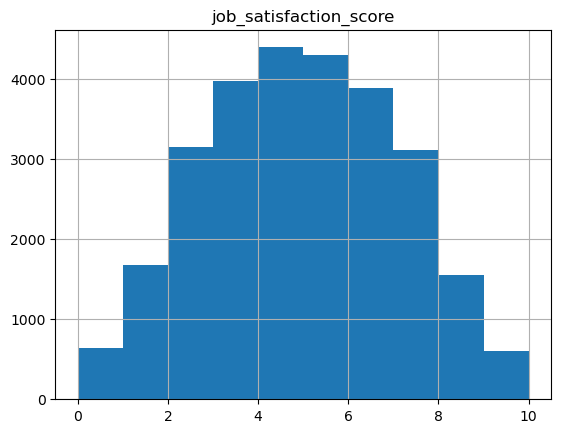

In [56]:
df.hist('job_satisfaction_score')
plt.show()

In [ ]:
median = df['screen_time_before_sleep'].median()  # handling missing data with median because this attribute has many outliers 
df['screen_time_before_sleep'].fillna(median, inplace=True)  

C:\Users\PC\AppData\Local\Temp\ipykernel_24760\712048566.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['screen_time_before_sleep'].fillna(median_daily_social_media_time, inplace=True)


In [57]:
mean = df['job_satisfaction_score'].mean()
df['job_satisfaction_score'].fillna(mean, inplace=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_24760\214552605.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['job_satisfaction_score'].fillna(mean, inplace=True)


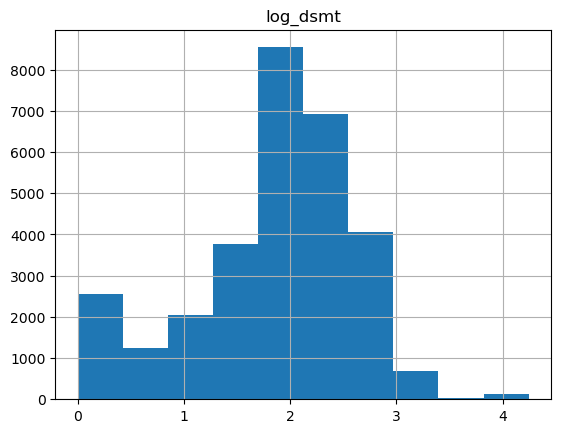

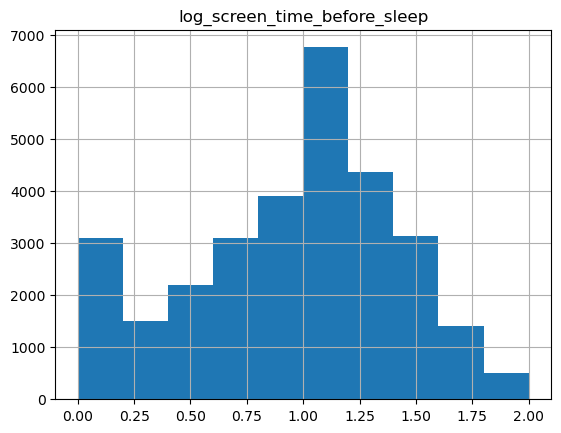

In [48]:
df['log_dsmt'] = np.log2(df['daily_social_media_time']+1)
df['log_screen_time_before_sleep'] = np.log2(df['screen_time_before_sleep']+1)

df.hist('log_dsmt')
df.hist('log_screen_time_before_sleep')
plt.show()

In [64]:
correlations = df.corr(numeric_only=True)
correlations

,age,daily_social_media_time,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score,log_dsmt,log_screen_time_before_sleep
age,1.000000,-0.002440,-0.003799,-0.003231,0.008585,0.010575,0.005264,0.002657,0.005075,-0.010918,0.001524,-0.005594,-0.001162,-0.002998,0.003086,0.013443,-0.001610,0.004822
daily_social_media_time,-0.002440,1.000000,-0.000876,-0.002855,-0.010445,-0.010486,0.000664,0.010654,-0.003910,0.014209,-0.004828,-0.003692,-0.003930,0.002301,-0.001430,-0.004012,0.926008,-0.004677
number_of_notifications,-0.003799,-0.000876,1.000000,0.013068,-0.003768,0.000457,-0.002994,0.003901,0.013328,0.008816,0.004320,-0.001722,0.006088,0.005248,-0.000938,-0.004498,0.000757,0.015552
work_hours_per_day,-0.003231,-0.002855,0.013068,1.000000,0.003814,-0.000113,0.002276,0.000895,-0.007136,-0.008151,-0.000395,0.002251,-0.003071,0.003391,-0.002061,-0.002058,-0.000007,-0.006957
perceived_productivity_score,0.008585,-0.010445,-0.003768,0.003814,1.000000,0.938977,0.001883,-0.012563,0.001721,-0.003013,-0.003760,-0.006750,0.000008,-0.011192,-0.004751,0.791146,-0.009954,0.000161
actual_productivity_score,0.010575,-0.010486,0.000457,-0.000113,0.938977,1.000000,0.001302,-0.007511,0.002380,-0.004203,-0.001023,-0.006856,0.001156,-0.011001,-0.004839,0.842238,-0.008694,0.000367
stress_level,0.005264,0.000664,-0.002994,0.002276,0.001883,0.001302,1.000000,0.003815,-0.001290,0.001102,0.001984,-0.011302,-0.000705,-0.000543,-0.004291,-0.000526,0.003006,-0.002845
sleep_hours,0.002657,0.010654,0.003901,0.000895,-0.012563,-0.007511,0.003815,1.000000,-0.001381,0.005373,0.001305,0.000156,0.009301,-0.005022,-0.006689,-0.004652,0.009106,-0.002834
screen_time_before_sleep,0.005075,-0.003910,0.013328,-0.007136,0.001721,0.002380,-0.001290,-0.001381,1.000000,-0.004169,-0.009959,0.001626,-0.003839,0.001355,-0.002838,0.004972,-0.002160,0.981255
breaks_during_work,-0.010918,0.014209,0.008816,-0.008151,-0.003013,-0.004203,0.001102,0.005373,-0.004169,1.000000,-0.004046,0.001016,0.004647,-0.003668,0.006579,-0.003113,0.008075,-0.004159


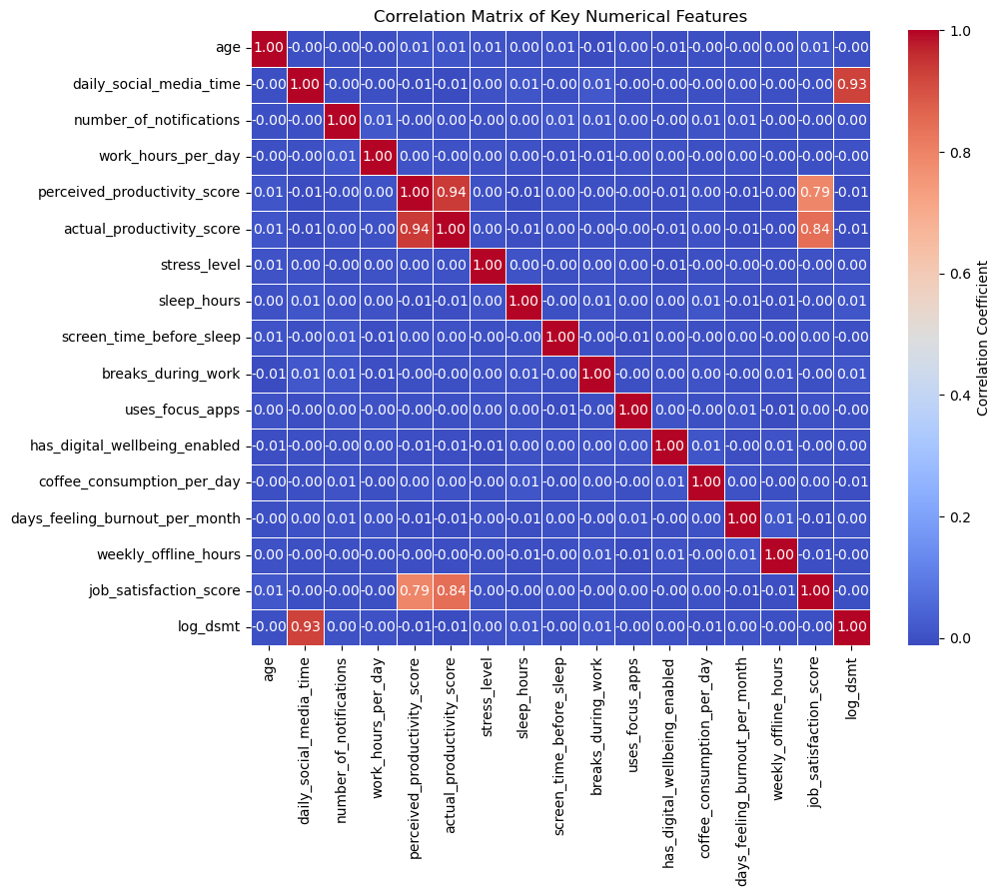

In [63]:
numerical_cols = [
    'age', 
    'daily_social_media_time', 
    'number_of_notifications', 
    'work_hours_per_day', 
    'perceived_productivity_score', 
    'actual_productivity_score', 
    'stress_level', 
    'sleep_hours',
    'screen_time_before_sleep',
    'breaks_during_work',
    'uses_focus_apps',
    'has_digital_wellbeing_enabled',
    'coffee_consumption_per_day',
    'days_feeling_burnout_per_month',
    'weekly_offline_hours',	
    'job_satisfaction_score',	
    'log_dsmt'
]

corr_matrix = df[numerical_cols].corr()

# 2. Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix, 
    annot=True,            
    fmt=".2f",             
    cmap='coolwarm',       
    linewidths=.5,         
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Correlation Matrix of Key Numerical Features')
plt.show()

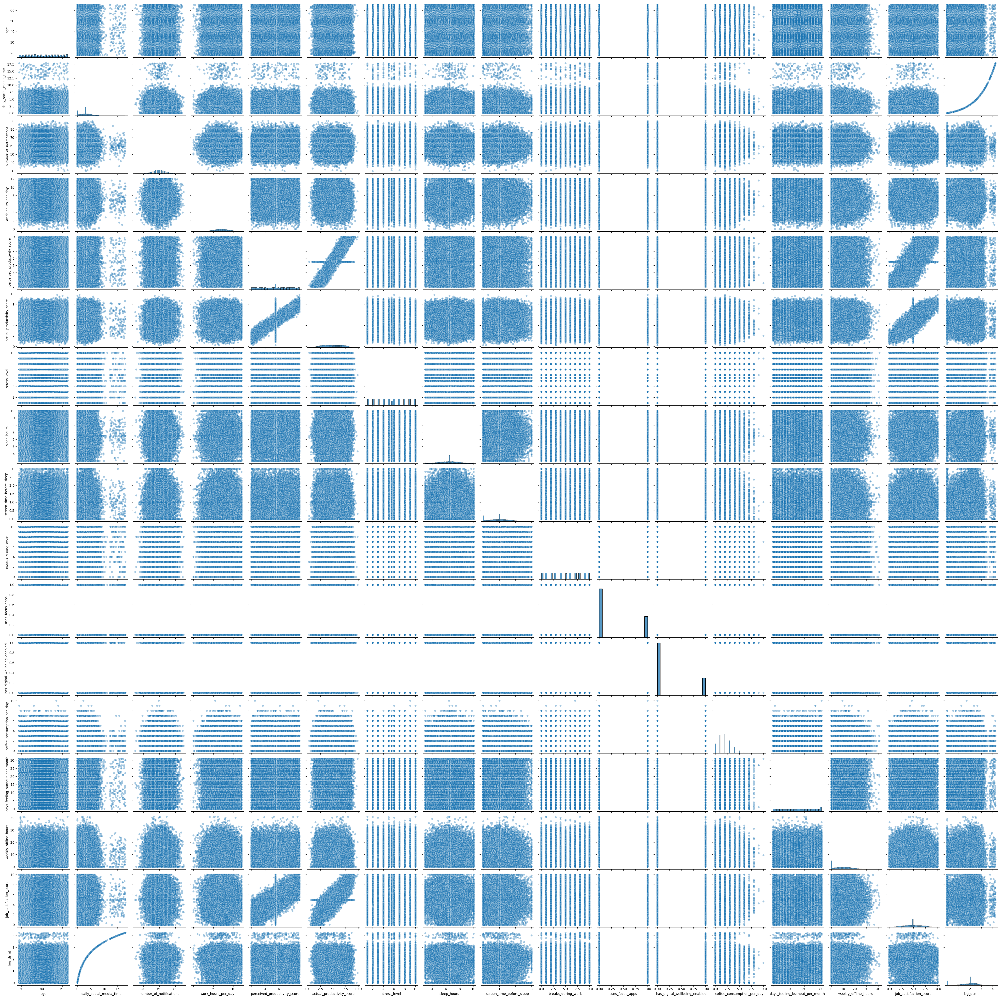

In [66]:
sns.pairplot(df[numerical_cols], kind='scatter', plot_kws={'alpha' : 0.4})